In [ ]:
from keras import Input, layers, backend, Model, losses, datasets, models, metrics, optimizers, initializers
from keras.utils import Sequence
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

In [ ]:

class FelixSequence(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        """Here self.x is a list of paths to .npy input files. self.y is a
        corresponding list of paths to .npy output files."""
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print(np.array([np.load(file_name) for file_name in batch_x]).shape, np.array([np.load(file_name) for file_name in batch_y]).shape)
        return np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_x]), np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_y])
    

def gen_paths_labels(base_path = "D:\\Uni Work\\Masters Project\\electron_dists\\Data\\VAE_000_1\\Data"):
    """A generator to yield (data-paths, corresponding labels) tuples for each
    segment of data (typically training, validation, and testing)."""
    for segment in sorted(os.listdir(base_path)):
        segment_path = os.path.join(base_path, segment)
        input_paths = []
        output_paths = []
        for crystal in os.listdir(segment_path):
            crystal_path = os.path.join(segment_path, crystal)
            files = sorted(os.listdir(crystal_path))
            input_paths.append(os.path.join(crystal_path, files[0]))
            output_paths.append(os.path.join(crystal_path, files[1]))
        yield [input_paths, output_paths]

def gen_paths_fromfile(Path):
    input_paths = []
    output_paths = []
    with open(Path) as textFile:
        lines = [line.split() for line in textFile]
    #print(lines)
    for i in lines:
        output_paths.append(i[0])
        input_paths.append(i[0].split("Output.npy")[0] + "Input.npy")
    return([input_paths, output_paths])

In [ ]:
latent_dim = 10

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [4]:
"""
## Build the encoder
"""
encoder_inputs = Input(shape=(128, 128, 1))
x = layers.Conv2D(32, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
#x = layers.Dropout(0.25)(x) #APPARANTLY THEY ARE BAD
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var", kernel_initializer='zeros', bias_initializer='zeros')(x)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 32)   2080        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   131136      conv2d[0][0]                     
__________________________________________________________________________________________________
flatten (Flatten)               (None, 65536)        0           conv2d_1[0][0]                   
____________________________________________________________________________________________

In [5]:
"""
## Build the decoder
"""


latent_inputs = Input(shape=(latent_dim,))
x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
#x = layers.Dropout(0.25)(x)
x = layers.Reshape((32, 32, 64))(x)
x = layers.Conv2DTranspose(128, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, kernel_size = (2, 2), activation="relu", padding="same")(x)
decoder = Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()


Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 10)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 65536)             720896    
_________________________________________________________________
reshape (Reshape)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 64, 64, 128)       524416    
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 128, 128, 64)      524352    
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 128, 128, 1)       257       
Total params: 1,769,921
Trainable params: 1,769,921
Non-trainable params: 0
_________________________________________________

In [6]:
class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        x, y = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(x)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)
                )
            )
            #print(z_mean, z_log_var, z)
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, data):
        return self.decoder(self.encoder(data)[2])

#losses.MSE(y, reconstruction), axis=(1, 2)
#losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)

In [7]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

vae = VAE(encoder, decoder)
vae.compile(optimizer=optimizers.Adam())

batch_size=64
data_path = "/home/ug-ml/felix-ML/VAE_000/Data/FilePaths/"

#data = [i for i in gen_paths_labels(data_path)]


ValidationPaths = gen_paths_fromfile(data_path + "Validation_10.txt")
TrainingPaths = gen_paths_fromfile(data_path + "Training_10.txt")
TestPaths = gen_paths_fromfile(data_path + "Test_10.txt")

val_seq = FelixSequence(ValidationPaths[0], ValidationPaths[1], batch_size)
train_seq = FelixSequence(TrainingPaths[0], TrainingPaths[1], batch_size)
test_seq = FelixSequence(TestPaths[0], TestPaths[1], batch_size)

vae.fit(train_seq, shuffle=True, workers=16, epochs=1500)



Epoch 1/1500
27/27 [==============================] - 3s 122ms/step - loss: 1129.7050 - reconstruction_loss: 917.0740 - kl_loss: 0.8440
Epoch 2/1500
27/27 [==============================] - 3s 119ms/step - loss: 623.1198 - reconstruction_loss: 563.3940 - kl_loss: 0.0946
Epoch 3/1500
27/27 [==============================] - 3s 119ms/step - loss: 498.1938 - reconstruction_loss: 487.7832 - kl_loss: 0.1714
Epoch 4/1500
27/27 [==============================] - 3s 119ms/step - loss: 484.7467 - reconstruction_loss: 484.0981 - kl_loss: 0.4586
Epoch 5/1500
27/27 [==============================] - 3s 118ms/step - loss: 464.5067 - reconstruction_loss: 474.0630 - kl_loss: 2.7980
Epoch 6/1500
27/27 [==============================] - 3s 118ms/step - loss: 473.3998 - reconstruction_loss: 461.5973 - kl_loss: 1.7951
Epoch 7/1500
27/27 [==============================] - 3s 118ms/step - loss: 447.4157 - reconstruction_loss: 444.9483 - kl_loss: 4.4484
Epoch 8/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 117ms/step - loss: 289.3915 - reconstruction_loss: 278.6155 - kl_loss: 13.8123
Epoch 62/1500
27/27 [==============================] - 3s 118ms/step - loss: 285.4276 - reconstruction_loss: 274.6760 - kl_loss: 13.5488
Epoch 63/1500
27/27 [==============================] - 3s 117ms/step - loss: 282.3260 - reconstruction_loss: 276.3713 - kl_loss: 13.5640
Epoch 64/1500
27/27 [==============================] - 3s 117ms/step - loss: 288.5506 - reconstruction_loss: 275.0103 - kl_loss: 13.8022
Epoch 65/1500
27/27 [==============================] - 3s 119ms/step - loss: 279.5859 - reconstruction_loss: 274.7471 - kl_loss: 13.3058
Epoch 66/1500
27/27 [==============================] - 3s 117ms/step - loss: 286.8842 - reconstruction_loss: 270.5166 - kl_loss: 14.2198
Epoch 67/1500
27/27 [==============================] - 3s 116ms/step - loss: 274.8964 - reconstruction_loss: 268.6527 - kl_loss: 13.8119
Epoch 68/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 117ms/step - loss: 229.0758 - reconstruction_loss: 209.2120 - kl_loss: 16.6526
Epoch 121/1500
27/27 [==============================] - 3s 118ms/step - loss: 219.3726 - reconstruction_loss: 206.6042 - kl_loss: 16.4681
Epoch 122/1500
27/27 [==============================] - 3s 119ms/step - loss: 224.3245 - reconstruction_loss: 213.4628 - kl_loss: 16.3433
Epoch 123/1500
27/27 [==============================] - 3s 118ms/step - loss: 246.4612 - reconstruction_loss: 229.3301 - kl_loss: 16.8340
Epoch 124/1500
27/27 [==============================] - 3s 118ms/step - loss: 244.3520 - reconstruction_loss: 220.6293 - kl_loss: 16.6539
Epoch 125/1500
27/27 [==============================] - 3s 118ms/step - loss: 239.9479 - reconstruction_loss: 218.7421 - kl_loss: 16.6622
Epoch 126/1500
27/27 [==============================] - 3s 117ms/step - loss: 228.2387 - reconstruction_loss: 210.4581 - kl_loss: 16.2087
Epoch 127/1500
27/27 [===========================

27/27 [==============================] - 3s 119ms/step - loss: 199.3086 - reconstruction_loss: 175.9305 - kl_loss: 17.4083
Epoch 180/1500
27/27 [==============================] - 3s 121ms/step - loss: 197.8628 - reconstruction_loss: 182.5622 - kl_loss: 17.3117
Epoch 181/1500
27/27 [==============================] - 3s 118ms/step - loss: 195.8603 - reconstruction_loss: 192.2650 - kl_loss: 17.4573
Epoch 182/1500
27/27 [==============================] - 3s 118ms/step - loss: 201.2729 - reconstruction_loss: 183.9844 - kl_loss: 17.6441
Epoch 183/1500
27/27 [==============================] - 5s 188ms/step - loss: 199.7645 - reconstruction_loss: 185.8024 - kl_loss: 17.4402
Epoch 184/1500
27/27 [==============================] - 3s 118ms/step - loss: 203.3734 - reconstruction_loss: 181.7997 - kl_loss: 17.2602
Epoch 185/1500
27/27 [==============================] - 3s 119ms/step - loss: 198.6510 - reconstruction_loss: 177.7170 - kl_loss: 17.3186
Epoch 186/1500
27/27 [===========================

27/27 [==============================] - 3s 119ms/step - loss: 180.7154 - reconstruction_loss: 166.1934 - kl_loss: 17.8967
Epoch 238/1500
27/27 [==============================] - 3s 118ms/step - loss: 191.1087 - reconstruction_loss: 164.7878 - kl_loss: 17.8686
Epoch 239/1500
27/27 [==============================] - 3s 118ms/step - loss: 172.2113 - reconstruction_loss: 156.1006 - kl_loss: 17.6853
Epoch 240/1500
27/27 [==============================] - 3s 120ms/step - loss: 165.2133 - reconstruction_loss: 154.2894 - kl_loss: 17.5696
Epoch 241/1500
27/27 [==============================] - 3s 120ms/step - loss: 174.9560 - reconstruction_loss: 155.4648 - kl_loss: 17.7999
Epoch 242/1500
27/27 [==============================] - 3s 119ms/step - loss: 173.6833 - reconstruction_loss: 158.0360 - kl_loss: 17.8943
Epoch 243/1500
27/27 [==============================] - 3s 120ms/step - loss: 168.0228 - reconstruction_loss: 163.1788 - kl_loss: 17.7567
Epoch 244/1500
27/27 [===========================

27/27 [==============================] - 3s 118ms/step - loss: 150.1185 - reconstruction_loss: 133.8498 - kl_loss: 18.3479
Epoch 297/1500
27/27 [==============================] - 3s 119ms/step - loss: 144.9439 - reconstruction_loss: 134.5346 - kl_loss: 18.3520
Epoch 298/1500
27/27 [==============================] - 3s 118ms/step - loss: 153.6667 - reconstruction_loss: 137.5245 - kl_loss: 18.2967
Epoch 299/1500
27/27 [==============================] - 3s 119ms/step - loss: 147.9976 - reconstruction_loss: 134.2057 - kl_loss: 18.2994
Epoch 300/1500
27/27 [==============================] - 3s 119ms/step - loss: 153.2291 - reconstruction_loss: 134.6694 - kl_loss: 18.2108
Epoch 301/1500
27/27 [==============================] - 3s 117ms/step - loss: 151.5909 - reconstruction_loss: 134.4664 - kl_loss: 18.2510
Epoch 302/1500
27/27 [==============================] - 3s 118ms/step - loss: 142.3369 - reconstruction_loss: 132.7296 - kl_loss: 18.3425
Epoch 303/1500
27/27 [===========================

27/27 [==============================] - 5s 203ms/step - loss: 134.0699 - reconstruction_loss: 122.8800 - kl_loss: 18.7014
Epoch 356/1500
27/27 [==============================] - 3s 118ms/step - loss: 133.4804 - reconstruction_loss: 120.3007 - kl_loss: 18.7442
Epoch 357/1500
27/27 [==============================] - 3s 121ms/step - loss: 138.6646 - reconstruction_loss: 118.6662 - kl_loss: 18.8481
Epoch 358/1500
27/27 [==============================] - 3s 120ms/step - loss: 134.2103 - reconstruction_loss: 120.8631 - kl_loss: 18.7733
Epoch 359/1500
27/27 [==============================] - 3s 119ms/step - loss: 139.1933 - reconstruction_loss: 120.9259 - kl_loss: 18.5903
Epoch 360/1500
27/27 [==============================] - 3s 119ms/step - loss: 137.4865 - reconstruction_loss: 120.9769 - kl_loss: 18.6064
Epoch 361/1500
27/27 [==============================] - 3s 118ms/step - loss: 133.4772 - reconstruction_loss: 119.6127 - kl_loss: 18.6777
Epoch 362/1500
27/27 [===========================

27/27 [==============================] - 3s 119ms/step - loss: 127.5638 - reconstruction_loss: 108.4107 - kl_loss: 18.8532
Epoch 415/1500
27/27 [==============================] - 3s 121ms/step - loss: 122.4418 - reconstruction_loss: 107.7063 - kl_loss: 18.7674
Epoch 416/1500
27/27 [==============================] - 3s 120ms/step - loss: 125.1647 - reconstruction_loss: 104.6508 - kl_loss: 18.9489
Epoch 417/1500
27/27 [==============================] - 3s 120ms/step - loss: 126.2803 - reconstruction_loss: 106.7633 - kl_loss: 18.8775
Epoch 418/1500
27/27 [==============================] - 3s 119ms/step - loss: 123.1247 - reconstruction_loss: 105.0293 - kl_loss: 18.8532
Epoch 419/1500
27/27 [==============================] - 3s 119ms/step - loss: 119.0971 - reconstruction_loss: 105.6665 - kl_loss: 18.9551
Epoch 420/1500
27/27 [==============================] - 3s 119ms/step - loss: 129.2157 - reconstruction_loss: 109.5756 - kl_loss: 19.0037
Epoch 421/1500
27/27 [===========================

27/27 [==============================] - 3s 122ms/step - loss: 129.0435 - reconstruction_loss: 110.3240 - kl_loss: 19.0951
Epoch 474/1500
27/27 [==============================] - 3s 120ms/step - loss: 117.3161 - reconstruction_loss: 101.9706 - kl_loss: 19.1308
Epoch 475/1500
27/27 [==============================] - 3s 119ms/step - loss: 123.0905 - reconstruction_loss: 101.2050 - kl_loss: 19.1086
Epoch 476/1500
27/27 [==============================] - 3s 119ms/step - loss: 116.5422 - reconstruction_loss: 97.9710 - kl_loss: 19.1076
Epoch 477/1500
27/27 [==============================] - 3s 119ms/step - loss: 114.7698 - reconstruction_loss: 98.0418 - kl_loss: 19.0933
Epoch 478/1500
27/27 [==============================] - 3s 119ms/step - loss: 123.6480 - reconstruction_loss: 98.5926 - kl_loss: 19.0423
Epoch 479/1500
27/27 [==============================] - 3s 121ms/step - loss: 118.2753 - reconstruction_loss: 100.3964 - kl_loss: 19.0307
Epoch 480/1500
27/27 [==============================

27/27 [==============================] - 3s 119ms/step - loss: 103.7492 - reconstruction_loss: 89.2107 - kl_loss: 19.1313
Epoch 533/1500
27/27 [==============================] - 3s 118ms/step - loss: 103.4644 - reconstruction_loss: 88.2641 - kl_loss: 19.0387
Epoch 534/1500
27/27 [==============================] - 3s 118ms/step - loss: 111.5660 - reconstruction_loss: 94.0590 - kl_loss: 19.1227
Epoch 535/1500
27/27 [==============================] - 3s 119ms/step - loss: 112.1448 - reconstruction_loss: 93.3442 - kl_loss: 19.1403
Epoch 536/1500
27/27 [==============================] - 3s 119ms/step - loss: 102.9367 - reconstruction_loss: 88.6811 - kl_loss: 19.0939
Epoch 537/1500
27/27 [==============================] - 3s 119ms/step - loss: 104.6845 - reconstruction_loss: 86.4637 - kl_loss: 19.1675
Epoch 538/1500
27/27 [==============================] - 3s 121ms/step - loss: 104.9577 - reconstruction_loss: 85.8968 - kl_loss: 19.1168
Epoch 539/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 99.5992 - reconstruction_loss: 84.5701 - kl_loss: 19.1569
Epoch 592/1500
27/27 [==============================] - 3s 119ms/step - loss: 100.2217 - reconstruction_loss: 82.5912 - kl_loss: 19.2948
Epoch 593/1500
27/27 [==============================] - 3s 119ms/step - loss: 104.2333 - reconstruction_loss: 82.5707 - kl_loss: 19.1936
Epoch 594/1500
27/27 [==============================] - 3s 122ms/step - loss: 101.2887 - reconstruction_loss: 81.2038 - kl_loss: 19.1722
Epoch 595/1500
27/27 [==============================] - 3s 120ms/step - loss: 99.0611 - reconstruction_loss: 82.8430 - kl_loss: 19.1098
Epoch 596/1500
27/27 [==============================] - 3s 120ms/step - loss: 102.5513 - reconstruction_loss: 88.0122 - kl_loss: 19.1253
Epoch 597/1500
27/27 [==============================] - 3s 119ms/step - loss: 113.1965 - reconstruction_loss: 94.2888 - kl_loss: 19.2527
Epoch 598/1500
27/27 [==============================] - 3s

Epoch 651/1500
27/27 [==============================] - 3s 122ms/step - loss: 101.5598 - reconstruction_loss: 81.1225 - kl_loss: 19.1824
Epoch 652/1500
27/27 [==============================] - 3s 120ms/step - loss: 101.9088 - reconstruction_loss: 84.1534 - kl_loss: 19.0649
Epoch 653/1500
27/27 [==============================] - 3s 119ms/step - loss: 106.9044 - reconstruction_loss: 89.3599 - kl_loss: 19.0397
Epoch 654/1500
27/27 [==============================] - 3s 120ms/step - loss: 106.1441 - reconstruction_loss: 86.8601 - kl_loss: 19.2034
Epoch 655/1500
27/27 [==============================] - 3s 121ms/step - loss: 97.1767 - reconstruction_loss: 83.6058 - kl_loss: 19.1600
Epoch 656/1500
27/27 [==============================] - 5s 196ms/step - loss: 97.7853 - reconstruction_loss: 82.3138 - kl_loss: 19.1606
Epoch 657/1500
27/27 [==============================] - 3s 119ms/step - loss: 102.8561 - reconstruction_loss: 88.5426 - kl_loss: 19.1883
Epoch 658/1500
27/27 [=====================

27/27 [==============================] - 3s 120ms/step - loss: 92.3712 - reconstruction_loss: 72.9226 - kl_loss: 19.2145
Epoch 712/1500
27/27 [==============================] - 3s 118ms/step - loss: 90.8217 - reconstruction_loss: 72.6952 - kl_loss: 19.1388
Epoch 713/1500
27/27 [==============================] - 3s 119ms/step - loss: 92.8566 - reconstruction_loss: 72.6730 - kl_loss: 19.1175
Epoch 714/1500
27/27 [==============================] - 6s 213ms/step - loss: 88.5706 - reconstruction_loss: 76.4408 - kl_loss: 19.1025
Epoch 715/1500
27/27 [==============================] - 3s 118ms/step - loss: 96.2540 - reconstruction_loss: 78.0525 - kl_loss: 19.2850
Epoch 716/1500
27/27 [==============================] - 3s 119ms/step - loss: 94.9064 - reconstruction_loss: 79.3495 - kl_loss: 19.2192
Epoch 717/1500
27/27 [==============================] - 6s 209ms/step - loss: 89.6678 - reconstruction_loss: 78.9163 - kl_loss: 19.2341
Epoch 718/1500
27/27 [==============================] - 3s 119m

27/27 [==============================] - 3s 120ms/step - loss: 92.6192 - reconstruction_loss: 79.4695 - kl_loss: 19.3227
Epoch 772/1500
27/27 [==============================] - 3s 120ms/step - loss: 100.9137 - reconstruction_loss: 80.7954 - kl_loss: 19.2134
Epoch 773/1500
27/27 [==============================] - 3s 119ms/step - loss: 97.1789 - reconstruction_loss: 80.5964 - kl_loss: 19.2233
Epoch 774/1500
27/27 [==============================] - 3s 119ms/step - loss: 96.8886 - reconstruction_loss: 81.3071 - kl_loss: 19.3193
Epoch 775/1500
27/27 [==============================] - 3s 119ms/step - loss: 96.7541 - reconstruction_loss: 77.1017 - kl_loss: 19.3717
Epoch 776/1500
27/27 [==============================] - 3s 119ms/step - loss: 96.5698 - reconstruction_loss: 76.3125 - kl_loss: 19.3281
Epoch 777/1500
27/27 [==============================] - 3s 119ms/step - loss: 92.2460 - reconstruction_loss: 72.8226 - kl_loss: 19.3419
Epoch 778/1500
27/27 [==============================] - 3s 119

27/27 [==============================] - 3s 119ms/step - loss: 87.6434 - reconstruction_loss: 73.8032 - kl_loss: 19.3461
Epoch 832/1500
27/27 [==============================] - 3s 119ms/step - loss: 89.9536 - reconstruction_loss: 72.3516 - kl_loss: 19.3309
Epoch 833/1500
27/27 [==============================] - 3s 121ms/step - loss: 90.3324 - reconstruction_loss: 69.4255 - kl_loss: 19.3527
Epoch 834/1500
27/27 [==============================] - 3s 119ms/step - loss: 86.2370 - reconstruction_loss: 68.0334 - kl_loss: 19.3187
Epoch 835/1500
27/27 [==============================] - 3s 119ms/step - loss: 88.2652 - reconstruction_loss: 68.7811 - kl_loss: 19.3189
Epoch 836/1500
27/27 [==============================] - 3s 119ms/step - loss: 87.3451 - reconstruction_loss: 70.2838 - kl_loss: 19.3178
Epoch 837/1500
27/27 [==============================] - 3s 119ms/step - loss: 89.8808 - reconstruction_loss: 73.0496 - kl_loss: 19.3447
Epoch 838/1500
27/27 [==============================] - 3s 118m

27/27 [==============================] - 3s 120ms/step - loss: 88.8282 - reconstruction_loss: 72.0708 - kl_loss: 19.2886
Epoch 892/1500
27/27 [==============================] - 3s 118ms/step - loss: 87.3388 - reconstruction_loss: 66.3337 - kl_loss: 19.3943
Epoch 893/1500
27/27 [==============================] - 3s 118ms/step - loss: 84.2990 - reconstruction_loss: 66.3831 - kl_loss: 19.2044
Epoch 894/1500
27/27 [==============================] - 3s 118ms/step - loss: 88.7652 - reconstruction_loss: 70.8098 - kl_loss: 19.1943
Epoch 895/1500
27/27 [==============================] - 3s 117ms/step - loss: 87.4706 - reconstruction_loss: 70.1156 - kl_loss: 19.1511
Epoch 896/1500
27/27 [==============================] - 3s 118ms/step - loss: 87.4594 - reconstruction_loss: 72.6689 - kl_loss: 19.2444
Epoch 897/1500
27/27 [==============================] - 3s 118ms/step - loss: 89.3163 - reconstruction_loss: 74.5937 - kl_loss: 19.2582
Epoch 898/1500
27/27 [==============================] - 3s 120m

27/27 [==============================] - 3s 117ms/step - loss: 84.9329 - reconstruction_loss: 68.4078 - kl_loss: 19.3143
Epoch 952/1500
27/27 [==============================] - 3s 121ms/step - loss: 84.8969 - reconstruction_loss: 68.8169 - kl_loss: 19.2500
Epoch 953/1500
27/27 [==============================] - 3s 119ms/step - loss: 88.9808 - reconstruction_loss: 67.6748 - kl_loss: 19.3680
Epoch 954/1500
27/27 [==============================] - 3s 118ms/step - loss: 84.0416 - reconstruction_loss: 65.5188 - kl_loss: 19.2951
Epoch 955/1500
27/27 [==============================] - 3s 119ms/step - loss: 82.5548 - reconstruction_loss: 65.9344 - kl_loss: 19.0676
Epoch 956/1500
27/27 [==============================] - 3s 120ms/step - loss: 83.9344 - reconstruction_loss: 66.3551 - kl_loss: 19.2452
Epoch 957/1500
27/27 [==============================] - 3s 119ms/step - loss: 88.2131 - reconstruction_loss: 69.7006 - kl_loss: 19.3854
Epoch 958/1500
27/27 [==============================] - 3s 120m

27/27 [==============================] - 3s 118ms/step - loss: 83.8797 - reconstruction_loss: 63.6261 - kl_loss: 19.3364
Epoch 1012/1500
27/27 [==============================] - 3s 118ms/step - loss: 84.2293 - reconstruction_loss: 69.0139 - kl_loss: 19.2519
Epoch 1013/1500
27/27 [==============================] - 3s 119ms/step - loss: 89.9181 - reconstruction_loss: 71.1322 - kl_loss: 19.3573
Epoch 1014/1500
27/27 [==============================] - 3s 118ms/step - loss: 86.5210 - reconstruction_loss: 68.5621 - kl_loss: 19.4361
Epoch 1015/1500
27/27 [==============================] - 6s 217ms/step - loss: 88.0642 - reconstruction_loss: 73.3460 - kl_loss: 19.4445
Epoch 1016/1500
27/27 [==============================] - 3s 118ms/step - loss: 86.6743 - reconstruction_loss: 69.3737 - kl_loss: 19.5212
Epoch 1017/1500
27/27 [==============================] - 3s 120ms/step - loss: 92.4755 - reconstruction_loss: 73.3399 - kl_loss: 19.4901
Epoch 1018/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 89.7301 - reconstruction_loss: 69.3310 - kl_loss: 19.3362
Epoch 1071/1500
27/27 [==============================] - 3s 120ms/step - loss: 88.5987 - reconstruction_loss: 74.9264 - kl_loss: 19.2531
Epoch 1072/1500
27/27 [==============================] - 5s 199ms/step - loss: 83.7935 - reconstruction_loss: 71.6799 - kl_loss: 19.2832
Epoch 1073/1500
27/27 [==============================] - 3s 118ms/step - loss: 84.8070 - reconstruction_loss: 67.4900 - kl_loss: 19.5792
Epoch 1074/1500
27/27 [==============================] - 3s 119ms/step - loss: 82.8736 - reconstruction_loss: 64.1333 - kl_loss: 19.5694
Epoch 1075/1500
27/27 [==============================] - 3s 119ms/step - loss: 81.2862 - reconstruction_loss: 62.7841 - kl_loss: 19.3989
Epoch 1076/1500
27/27 [==============================] - 3s 119ms/step - loss: 83.3089 - reconstruction_loss: 64.2761 - kl_loss: 19.3928
Epoch 1077/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 119ms/step - loss: 84.4568 - reconstruction_loss: 63.8539 - kl_loss: 19.3499
Epoch 1130/1500
27/27 [==============================] - 3s 119ms/step - loss: 79.4157 - reconstruction_loss: 63.1040 - kl_loss: 19.3302
Epoch 1131/1500
27/27 [==============================] - 3s 118ms/step - loss: 82.4076 - reconstruction_loss: 62.5888 - kl_loss: 19.3610
Epoch 1132/1500
27/27 [==============================] - 3s 119ms/step - loss: 79.8387 - reconstruction_loss: 59.1402 - kl_loss: 19.3163
Epoch 1133/1500
27/27 [==============================] - 3s 117ms/step - loss: 82.1448 - reconstruction_loss: 60.9416 - kl_loss: 19.4008
Epoch 1134/1500
27/27 [==============================] - 3s 118ms/step - loss: 80.0941 - reconstruction_loss: 60.0211 - kl_loss: 19.4161
Epoch 1135/1500
27/27 [==============================] - 3s 118ms/step - loss: 80.6400 - reconstruction_loss: 62.2971 - kl_loss: 19.4144
Epoch 1136/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 80.7279 - reconstruction_loss: 63.5895 - kl_loss: 19.2001
Epoch 1189/1500
27/27 [==============================] - 3s 120ms/step - loss: 82.8660 - reconstruction_loss: 64.4794 - kl_loss: 19.3403
Epoch 1190/1500
27/27 [==============================] - 3s 118ms/step - loss: 82.9788 - reconstruction_loss: 61.5729 - kl_loss: 19.2831
Epoch 1191/1500
27/27 [==============================] - 3s 122ms/step - loss: 80.3121 - reconstruction_loss: 63.2120 - kl_loss: 19.2629
Epoch 1192/1500
27/27 [==============================] - 3s 118ms/step - loss: 81.7780 - reconstruction_loss: 66.3822 - kl_loss: 19.1813
Epoch 1193/1500
27/27 [==============================] - 3s 118ms/step - loss: 86.0867 - reconstruction_loss: 66.9204 - kl_loss: 19.3616
Epoch 1194/1500
27/27 [==============================] - 3s 120ms/step - loss: 85.6334 - reconstruction_loss: 65.3568 - kl_loss: 19.5103
Epoch 1195/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 117ms/step - loss: 75.6971 - reconstruction_loss: 61.4248 - kl_loss: 19.2454
Epoch 1248/1500
27/27 [==============================] - 3s 119ms/step - loss: 79.9212 - reconstruction_loss: 61.7794 - kl_loss: 19.4235
Epoch 1249/1500
27/27 [==============================] - 3s 119ms/step - loss: 82.8654 - reconstruction_loss: 63.3549 - kl_loss: 19.4690
Epoch 1250/1500
27/27 [==============================] - 3s 120ms/step - loss: 89.9947 - reconstruction_loss: 69.2379 - kl_loss: 19.4788
Epoch 1251/1500
27/27 [==============================] - 3s 120ms/step - loss: 84.1107 - reconstruction_loss: 67.1662 - kl_loss: 19.3773
Epoch 1252/1500
27/27 [==============================] - 3s 118ms/step - loss: 82.4016 - reconstruction_loss: 64.6614 - kl_loss: 19.2662
Epoch 1253/1500
27/27 [==============================] - 3s 119ms/step - loss: 79.3531 - reconstruction_loss: 60.9189 - kl_loss: 19.3955
Epoch 1254/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 119ms/step - loss: 77.3191 - reconstruction_loss: 60.2951 - kl_loss: 19.3312
Epoch 1307/1500
27/27 [==============================] - 3s 121ms/step - loss: 79.9256 - reconstruction_loss: 60.1055 - kl_loss: 19.2783
Epoch 1308/1500
27/27 [==============================] - 3s 120ms/step - loss: 76.2751 - reconstruction_loss: 58.0937 - kl_loss: 19.3639
Epoch 1309/1500
27/27 [==============================] - 3s 121ms/step - loss: 76.6589 - reconstruction_loss: 56.9508 - kl_loss: 19.3536
Epoch 1310/1500
27/27 [==============================] - 3s 121ms/step - loss: 78.4551 - reconstruction_loss: 60.3744 - kl_loss: 19.1672
Epoch 1311/1500
27/27 [==============================] - 3s 120ms/step - loss: 77.9532 - reconstruction_loss: 60.6415 - kl_loss: 19.2718
Epoch 1312/1500
27/27 [==============================] - 3s 120ms/step - loss: 80.5477 - reconstruction_loss: 59.8961 - kl_loss: 19.3130
Epoch 1313/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 80.0101 - reconstruction_loss: 60.3535 - kl_loss: 19.2133
Epoch 1366/1500
27/27 [==============================] - 3s 119ms/step - loss: 78.3899 - reconstruction_loss: 60.3353 - kl_loss: 19.3706
Epoch 1367/1500
27/27 [==============================] - 3s 120ms/step - loss: 76.7877 - reconstruction_loss: 57.9415 - kl_loss: 19.4930
Epoch 1368/1500
27/27 [==============================] - 3s 119ms/step - loss: 74.9558 - reconstruction_loss: 59.4831 - kl_loss: 19.3100
Epoch 1369/1500
27/27 [==============================] - 3s 119ms/step - loss: 76.5884 - reconstruction_loss: 58.5530 - kl_loss: 19.2758
Epoch 1370/1500
27/27 [==============================] - 3s 118ms/step - loss: 75.7928 - reconstruction_loss: 57.1250 - kl_loss: 19.3018
Epoch 1371/1500
27/27 [==============================] - 3s 120ms/step - loss: 78.1613 - reconstruction_loss: 61.4091 - kl_loss: 19.3816
Epoch 1372/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 76.4275 - reconstruction_loss: 59.0671 - kl_loss: 19.3635
Epoch 1425/1500
27/27 [==============================] - 3s 120ms/step - loss: 78.3117 - reconstruction_loss: 59.4699 - kl_loss: 19.4192
Epoch 1426/1500
27/27 [==============================] - 3s 120ms/step - loss: 74.8732 - reconstruction_loss: 59.2821 - kl_loss: 19.3697
Epoch 1427/1500
27/27 [==============================] - 3s 121ms/step - loss: 80.3788 - reconstruction_loss: 60.4140 - kl_loss: 19.3012
Epoch 1428/1500
27/27 [==============================] - 3s 119ms/step - loss: 78.1737 - reconstruction_loss: 56.9928 - kl_loss: 19.3081
Epoch 1429/1500
27/27 [==============================] - 3s 118ms/step - loss: 70.6556 - reconstruction_loss: 54.0461 - kl_loss: 19.2738
Epoch 1430/1500
27/27 [==============================] - 3s 119ms/step - loss: 71.1575 - reconstruction_loss: 52.8943 - kl_loss: 19.3158
Epoch 1431/1500
27/27 [==============================] - 

27/27 [==============================] - 3s 120ms/step - loss: 73.8540 - reconstruction_loss: 55.5693 - kl_loss: 19.1453
Epoch 1484/1500
27/27 [==============================] - 3s 124ms/step - loss: 77.5867 - reconstruction_loss: 56.1629 - kl_loss: 19.3023
Epoch 1485/1500
27/27 [==============================] - 3s 122ms/step - loss: 77.0355 - reconstruction_loss: 59.4921 - kl_loss: 19.1631
Epoch 1486/1500
27/27 [==============================] - 3s 121ms/step - loss: 74.1763 - reconstruction_loss: 56.1018 - kl_loss: 19.1043
Epoch 1487/1500
27/27 [==============================] - 3s 122ms/step - loss: 75.5629 - reconstruction_loss: 54.7403 - kl_loss: 19.1531
Epoch 1488/1500
27/27 [==============================] - 3s 120ms/step - loss: 75.6375 - reconstruction_loss: 55.6788 - kl_loss: 19.1911
Epoch 1489/1500
27/27 [==============================] - 3s 119ms/step - loss: 77.8700 - reconstruction_loss: 59.9776 - kl_loss: 19.2653
Epoch 1490/1500
27/27 [==============================] - 

In [8]:
vae.save("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_4")


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_4/assets


In [ ]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/115/Input.npy


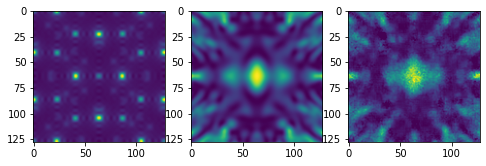

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/1288/Input.npy


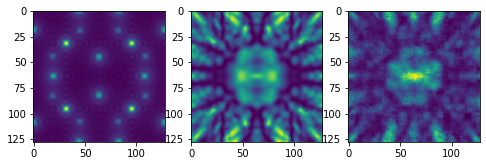

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/1861/Input.npy


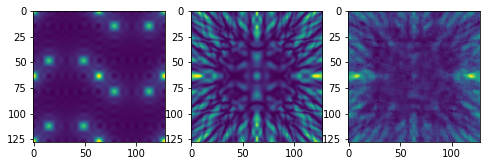

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/2163/Input.npy


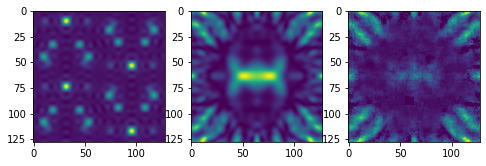

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/2315/Input.npy


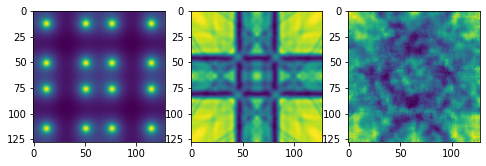

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/2517/Input.npy


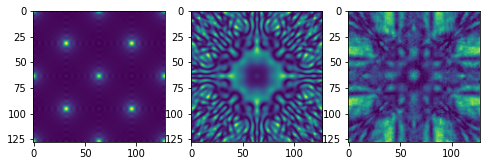

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/3012/Input.npy


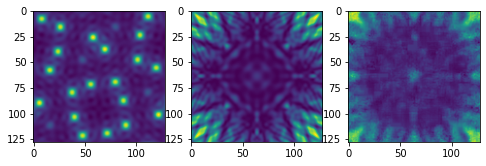

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/3535/Input.npy


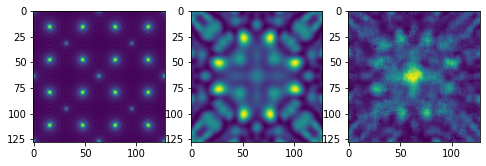

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/4458/Input.npy


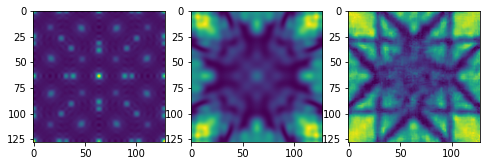

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/4690/Input.npy


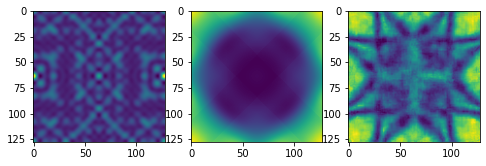

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/489/Input.npy


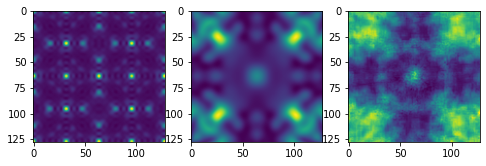

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6072/Input.npy


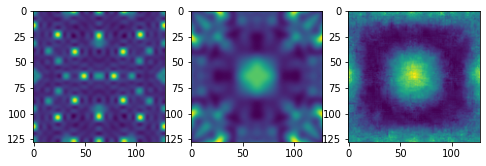

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6507/Input.npy


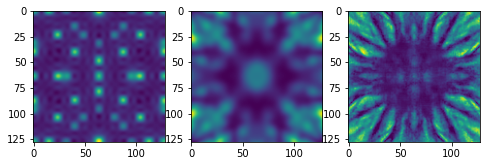

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6721/Input.npy


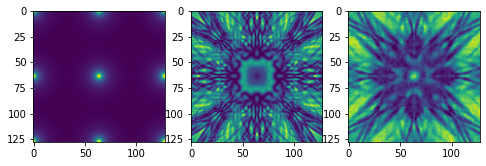

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/701/Input.npy


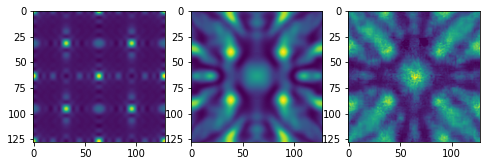

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/881/Input.npy


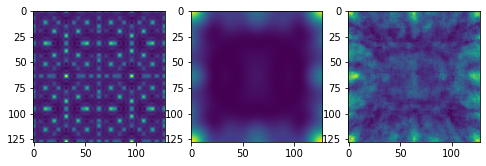

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1045/Input.npy


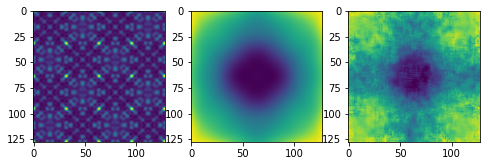

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1116/Input.npy


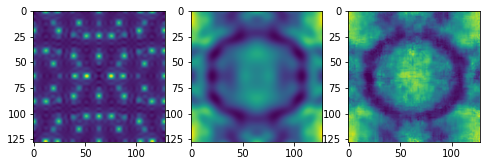

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1152/Input.npy


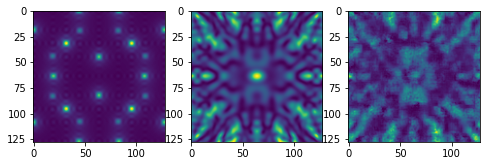

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1184/Input.npy


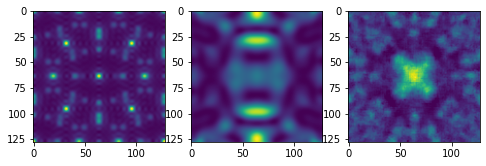

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1192/Input.npy


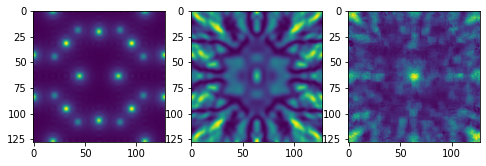

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1219/Input.npy


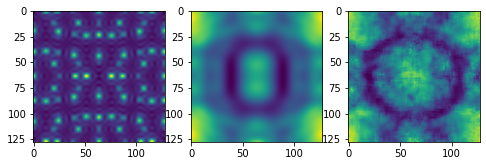

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1267/Input.npy


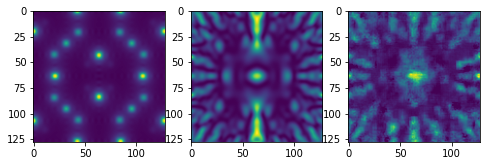

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1406/Input.npy


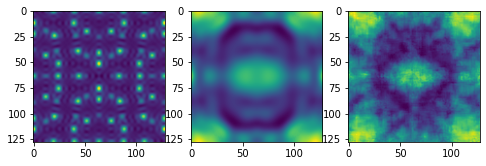

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1564/Input.npy


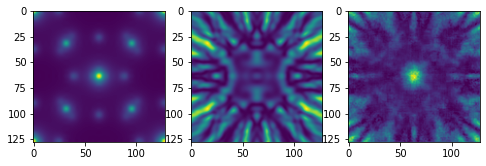

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1577/Input.npy


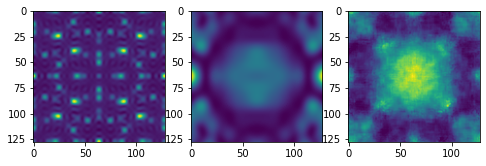

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1630/Input.npy


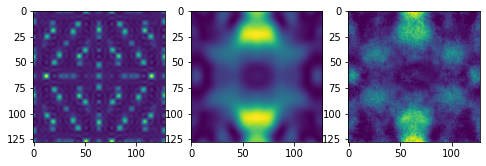

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1636/Input.npy


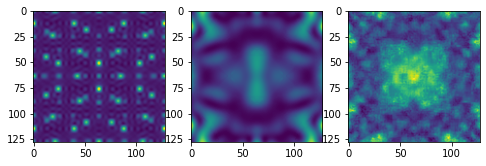

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1794/Input.npy


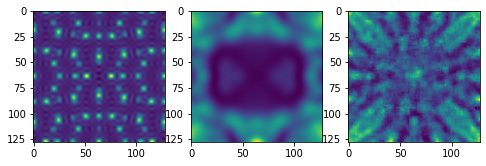

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1799/Input.npy


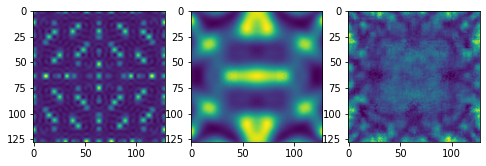

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1821/Input.npy


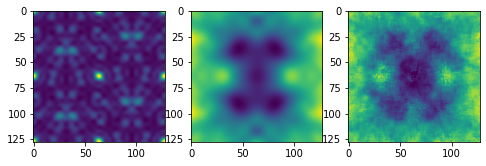

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1899/Input.npy


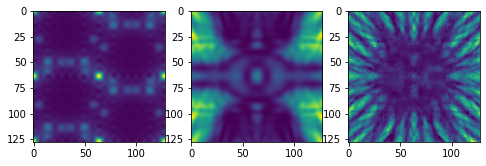

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1911/Input.npy


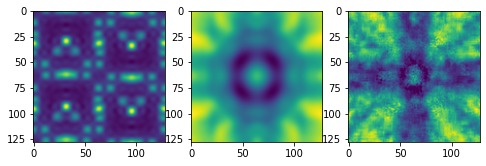

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1918/Input.npy


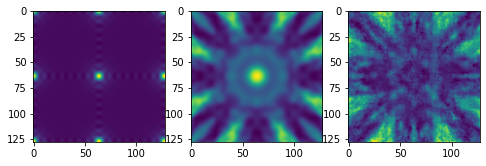

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2066/Input.npy


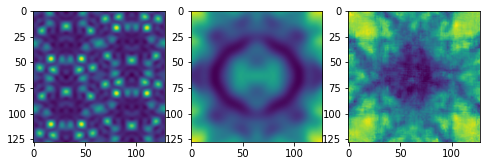

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2097/Input.npy


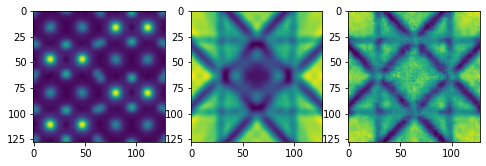

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2159/Input.npy


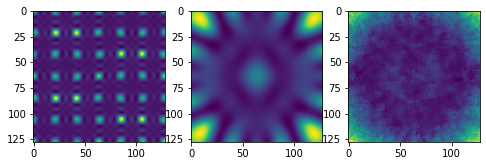

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2204/Input.npy


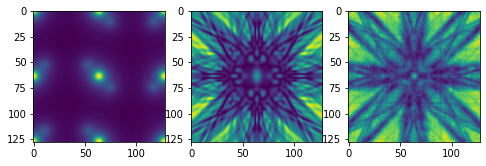

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2238/Input.npy


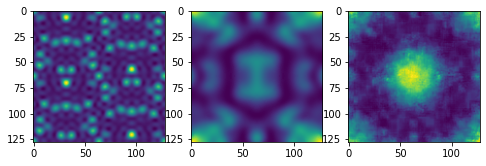

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2275/Input.npy


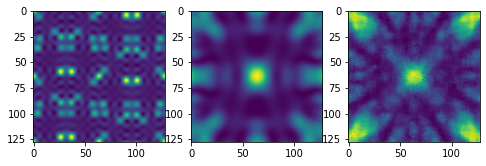

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2283/Input.npy


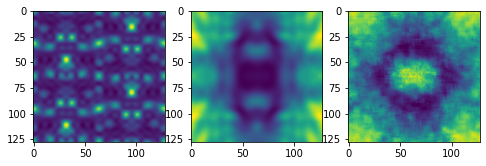

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2298/Input.npy


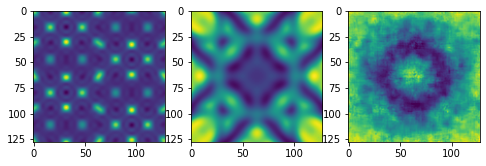

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2446/Input.npy


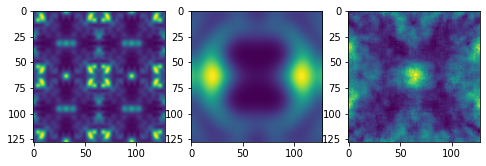

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2654/Input.npy


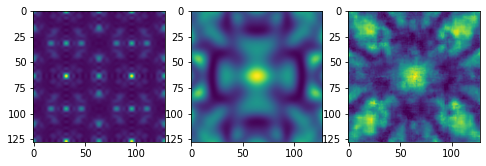

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/284/Input.npy


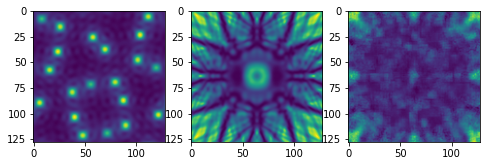

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2881/Input.npy


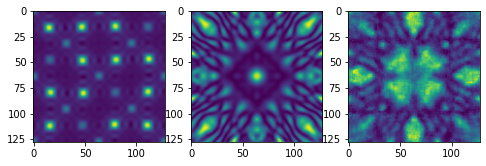

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/294/Input.npy


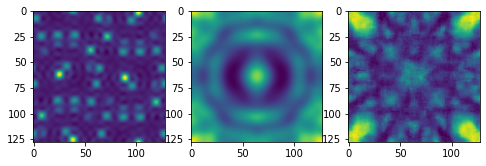

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3139/Input.npy


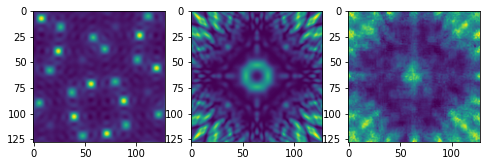

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3166/Input.npy


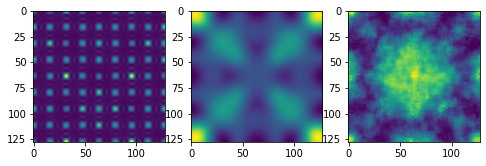

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3325/Input.npy


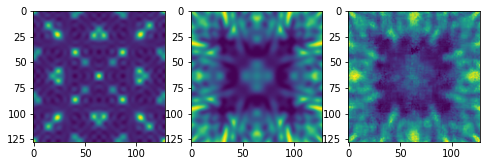

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3363/Input.npy


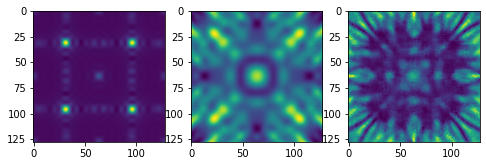

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3372/Input.npy


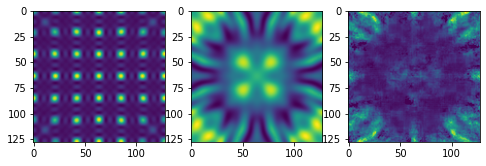

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3472/Input.npy


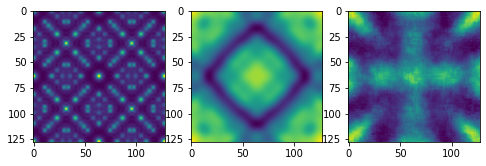

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3581/Input.npy


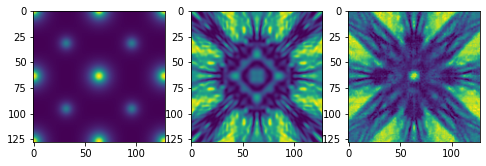

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3645/Input.npy


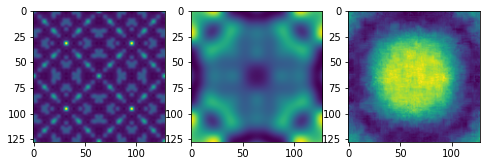

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3872/Input.npy


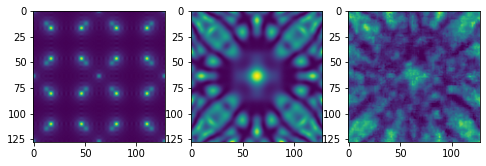

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3932/Input.npy


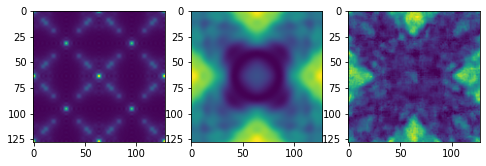

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4047/Input.npy


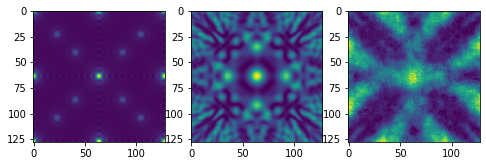

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4080/Input.npy


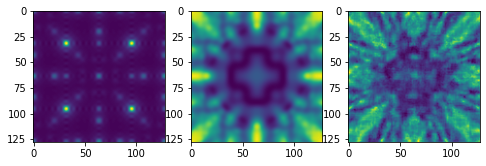

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4330/Input.npy


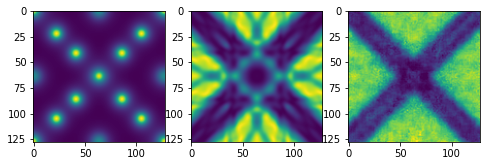

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4440/Input.npy


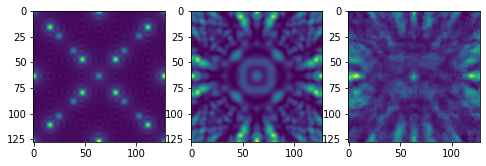

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4525/Input.npy


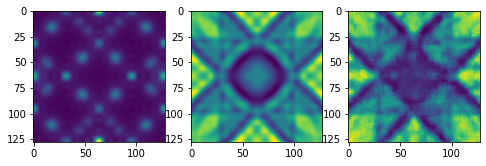

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4639/Input.npy


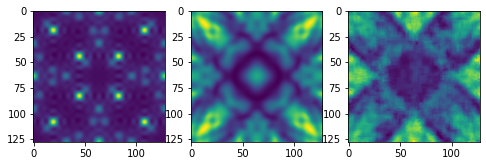

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4708/Input.npy


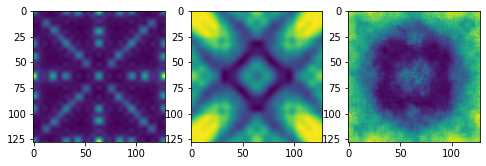

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4794/Input.npy


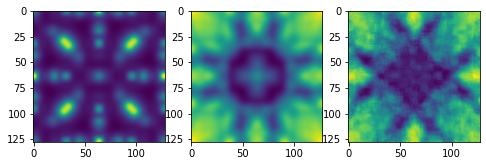

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4980/Input.npy


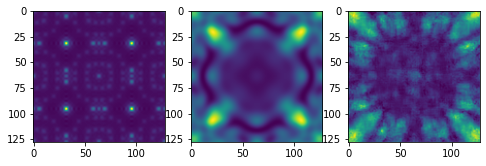

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5013/Input.npy


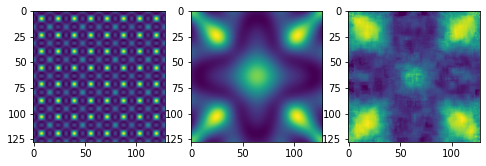

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5051/Input.npy


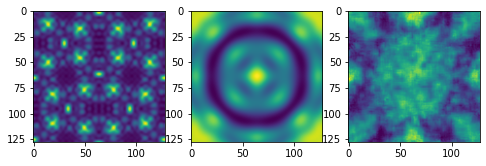

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5218/Input.npy


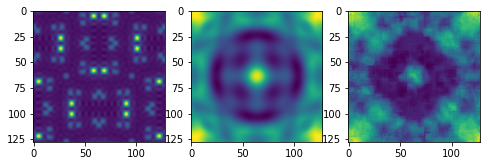

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/522/Input.npy


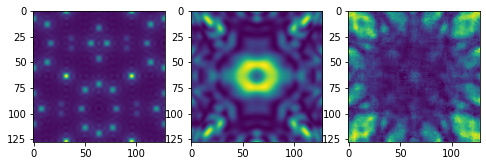

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5264/Input.npy


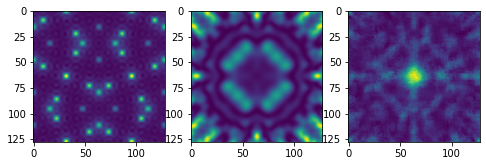

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5345/Input.npy


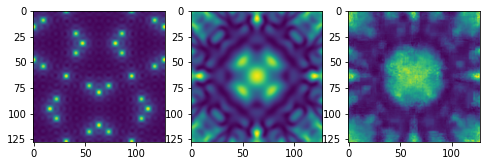

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5456/Input.npy


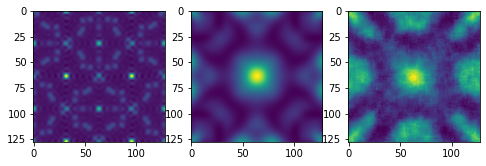

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6264/Input.npy


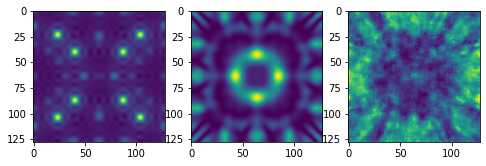

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6711/Input.npy


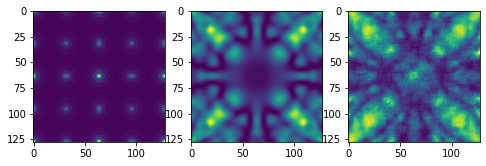

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6732/Input.npy


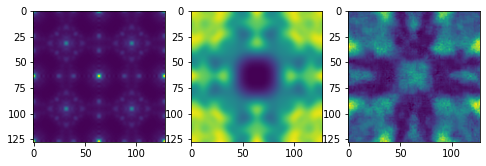

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6778/Input.npy


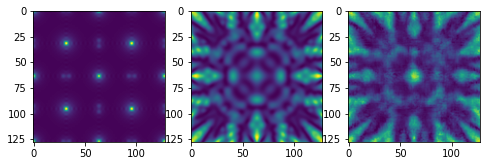

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6785/Input.npy


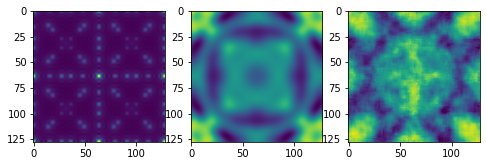

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6845/Input.npy


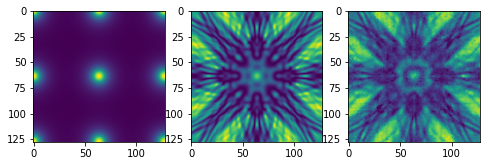

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6961/Input.npy


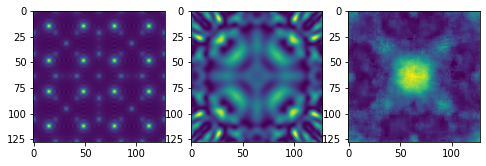

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/711/Input.npy


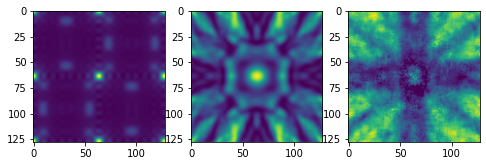

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7155/Input.npy


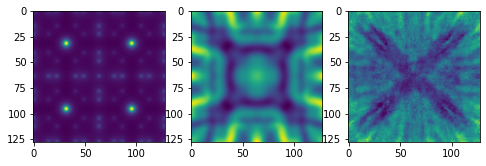

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7184/Input.npy


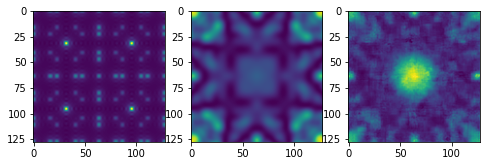

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7222/Input.npy


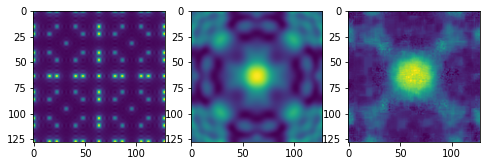

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/724/Input.npy


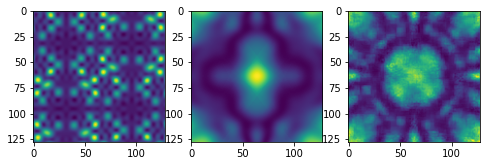

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7289/Input.npy


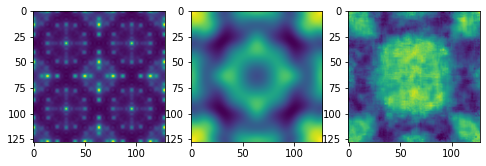

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7381/Input.npy


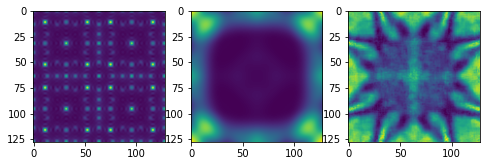

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/809/Input.npy


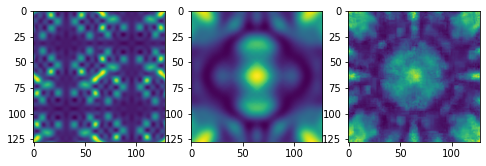

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/825/Input.npy


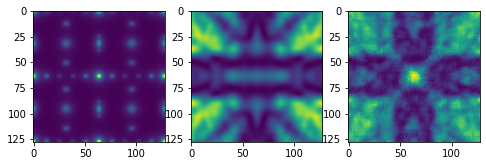

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/86/Input.npy


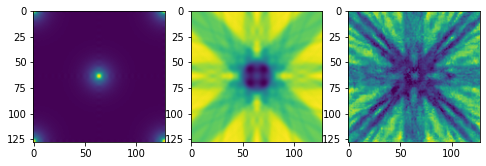

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/887/Input.npy


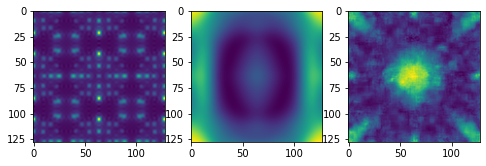

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/924/Input.npy


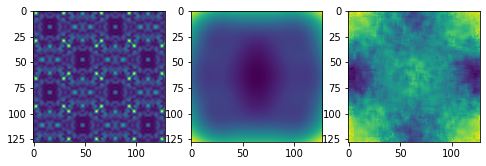

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/945/Input.npy


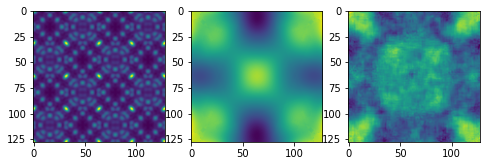

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/1265/Input.npy


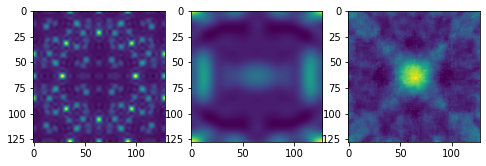

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/3604/Input.npy


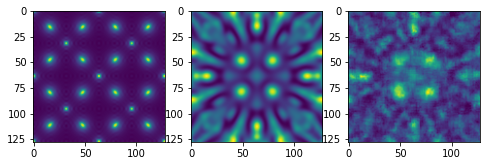

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/3612/Input.npy


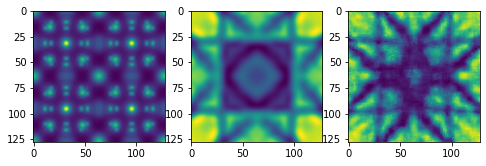

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/4468/Input.npy


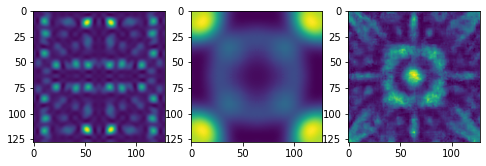

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/6383/Input.npy


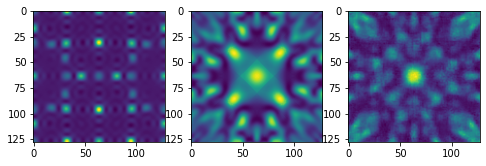

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/6865/Input.npy


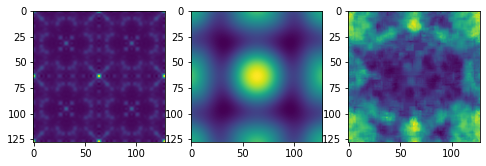

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/871/Input.npy


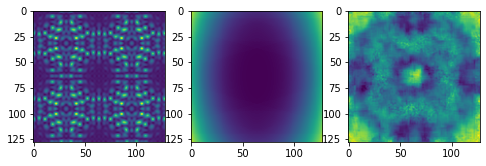

In [9]:

for i in range(0, len(TestPaths[0])):
    #x = np.load(data[0][0][i])
    #y = np.load(data[0][1][i])
    x = np.load(TestPaths[0][i])
    y = np.load(TestPaths[1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))
    print(TestPaths[0][i])

    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()

In [ ]:
for i in range(0, len(TrainingPaths[0])):
    #x = np.load(data[0][0][i])
    #y = np.load(data[0][1][i])
    x = np.load(TrainingPaths[0][i])
    y = np.load(TrainingPaths[1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))
    print(TrainingPaths[0][i])

    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()